**Importing Data**

In [1]:
!unzip "/content/drive/MyDrive/REDUCED DATA/dataset.zip"

Streaming output truncated to the last 5000 lines.
  inflating: dataset/TCGA-LUAD/valid_TCGA-49-4488-01A-01-BS1.334cd670-30d0-48bd-8910-2ec1f42ce8c2_7_19.jpeg  
  inflating: dataset/TCGA-LUAD/valid_TCGA-49-4488-01A-01-BS1.334cd670-30d0-48bd-8910-2ec1f42ce8c2_9_22.jpeg  
   creating: dataset/TCGA-LUSC/
  inflating: dataset/TCGA-LUSC/test_TCGA-18-3411-01A-01-BS1.45372e19-1f8e-4d40-8df1-76ed5e0d8bae_10_12.jpeg  
  inflating: dataset/TCGA-LUSC/test_TCGA-18-3411-01A-01-BS1.45372e19-1f8e-4d40-8df1-76ed5e0d8bae_11_8.jpeg  
  inflating: dataset/TCGA-LUSC/test_TCGA-18-3411-01A-01-BS1.45372e19-1f8e-4d40-8df1-76ed5e0d8bae_13_17.jpeg  
  inflating: dataset/TCGA-LUSC/test_TCGA-18-3411-01A-01-BS1.45372e19-1f8e-4d40-8df1-76ed5e0d8bae_13_5.jpeg  
  inflating: dataset/TCGA-LUSC/test_TCGA-18-3411-01A-01-BS1.45372e19-1f8e-4d40-8df1-76ed5e0d8bae_15_10.jpeg  
  inflating: dataset/TCGA-LUSC/test_TCGA-18-3411-01A-01-BS1.45372e19-1f8e-4d40-8df1-76ed5e0d8bae_15_14.jpeg  
  inflating: dataset/TCGA-LUSC/test_TCG

**Importing important libraries**

In [ ]:
import cv2
import os
import time

import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from tensorflow import keras
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Input, Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from glob import glob

**Setting Constants**

In [2]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS= 3
EPOCHS= 50

**Importing Data into TensorFlow Dataset**

In [ ]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "dataset",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 12433 files belonging to 3 classes.


In [ ]:
class_names = dataset.class_names
class_names

['Solid_Tissue_Normal', 'TCGA-LUAD', 'TCGA-LUSC']

In [ ]:
for image_batch, labels_batch in dataset.take(1):
    print(image_batch.shape)
    print(labels_batch.numpy())

(32, 256, 256, 3)
[2 0 1 2 1 2 0 2 2 0 0 0 1 1 2 0 1 2 0 2 0 1 0 1 2 2 1 1 2 1 1 0]


**Visualization**

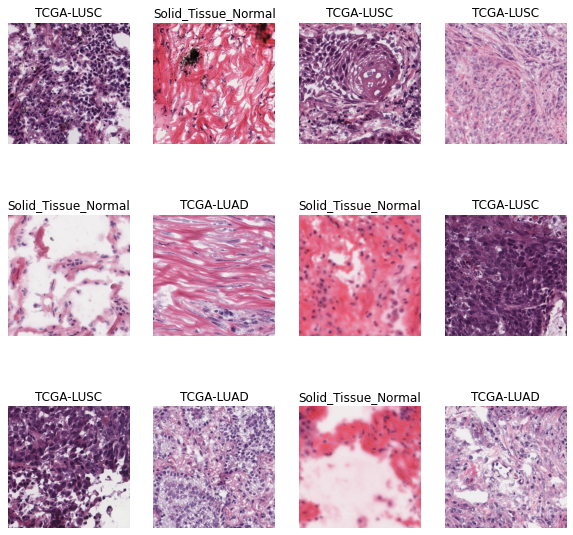

In [ ]:
plt.figure(figsize=(10, 10))
for image_batch, labels_batch in dataset.take(1):
    for i in range(12):
        ax = plt.subplot(3, 4, i + 1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[labels_batch[i]])
        plt.axis("off")

**Splitting data into Train, Test and Validation**

In [ ]:
len(dataset)

389

In [ ]:
train_size = 0.8
len(dataset)*train_size

311.20000000000005

In [ ]:
train_ds = dataset.take(311)
len(train_ds)

311

In [ ]:
test_ds = dataset.skip(311)
len(test_ds)

78

In [ ]:
val_size=0.1
len(dataset)*val_size

38.900000000000006

In [ ]:
val_ds = test_ds.take(39)
len(val_ds)

39

In [ ]:
test_ds = test_ds.skip(39)
len(test_ds)

39

In [ ]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [ ]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [ ]:
len(train_ds)

311

In [ ]:
len(test_ds)

40

In [ ]:
len(val_ds)

38

**Cache, Shuffle and Prefetch the Dataset**

In [ ]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

# VGG19

In [ ]:
vgg = VGG19(include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), pooling='avg', weights='imagenet')

In [ ]:
for layer in vgg.layers:
    layer.trainable = False
    
# This will let us use the default weights used by the imagenet.

In [ ]:
# Set the flatten layer.
x_1 = Flatten() (vgg.output)

In [ ]:
prediction_1 = Dense(3, activation = 'softmax')(x_1)

In [ ]:
# Create a model Object
model_1 = Model(inputs = vgg.input, outputs = prediction_1)

In [ ]:
model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
model_1.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
history_1 = model_1.fit(
    train_ds, 
    batch_size = BATCH_SIZE , 
    epochs = EPOCHS , 
    validation_data = val_ds,
    )

Epoch 1/50
311/311 [==============================] - 67s 167ms/step - loss: 1.0516 - accuracy: 0.6306 - val_loss: 0.6202 - val_accuracy: 0.7426
Epoch 2/50
311/311 [==============================] - 39s 125ms/step - loss: 0.5562 - accuracy: 0.7741 - val_loss: 0.5142 - val_accuracy: 0.7895
Epoch 3/50
311/311 [==============================] - 39s 124ms/step - loss: 0.4731 - accuracy: 0.8142 - val_loss: 0.4410 - val_accuracy: 0.8248
Epoch 4/50
311/311 [==============================] - 39s 124ms/step - loss: 0.4304 - accuracy: 0.8275 - val_loss: 0.4415 - val_accuracy: 0.8199
Epoch 5/50
311/311 [==============================] - 39s 124ms/step - loss: 0.4085 - accuracy: 0.8392 - val_loss: 0.3985 - val_accuracy: 0.8355
Epoch 6/50
311/311 [==============================] - 38s 124ms/step - loss: 0.3930 - accuracy: 0.8423 - val_loss: 0.3837 - val_accuracy: 0.8462
Epoch 7/50
311/311 [==============================] - 38s 124ms/step - loss: 0.3879 - accuracy: 0.8478 - val_loss: 0.3913 - val_ac

In [ ]:
scores_1 = model_1.evaluate(test_ds)

40/40 [==============================] - 17s 111ms/step - loss: 0.3489 - accuracy: 0.8547


In [ ]:
res_df_1 = pd.DataFrame(history_1.history)
res_df_1

,loss,accuracy,val_loss,val_accuracy
0,1.051589,0.630627,0.620208,0.742599
1,0.556245,0.774116,0.514159,0.789474
2,0.473067,0.814208,0.441028,0.824836
3,0.430362,0.827472,0.441492,0.819901
4,0.408471,0.839228,0.398457,0.835526
5,0.393042,0.842343,0.383691,0.846217
6,0.387927,0.847769,0.391331,0.843750
7,0.370706,0.851387,0.370564,0.840461
8,0.370211,0.852291,0.374753,0.847039
9,0.364355,0.851487,0.381114,0.851974


In [ ]:
acc_1 = history_1.history['accuracy']
val_acc_1 = history_1.history['val_accuracy']

loss_1 = history_1.history['loss']
val_loss_1 = history_1.history['val_loss']

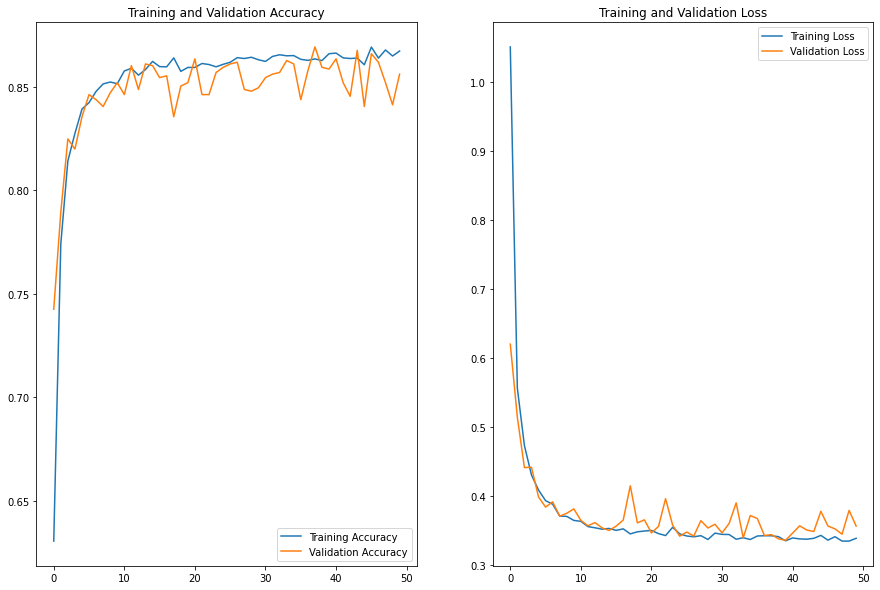

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc_1, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_1, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss_1, label='Training Loss')
plt.plot(range(EPOCHS), val_loss_1, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: Solid_Tissue_Normal
predicted label: Solid_Tissue_Normal


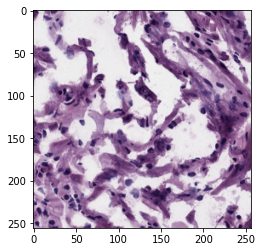

In [ ]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_1.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

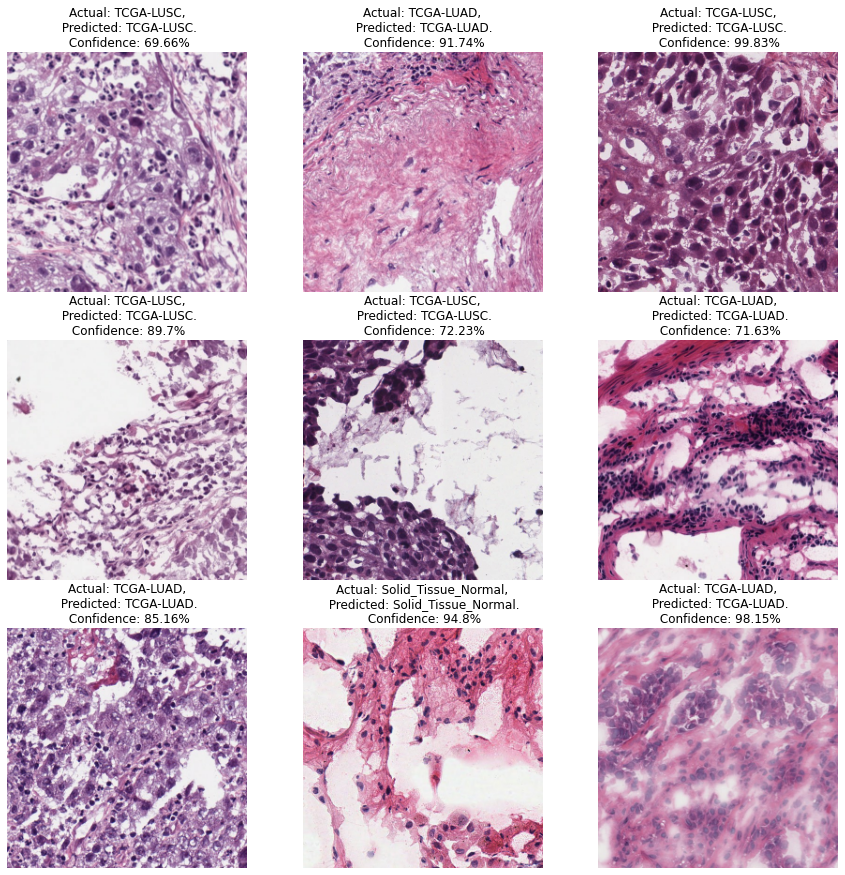

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_1, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [ ]:
#model_1.save('VGG19_Best.h5')

# ResNet50

In [ ]:
resnet = ResNet50(
    input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3), # Making the image into 3 Channel, so concating 3.
    weights = 'imagenet', # Default weights.
    pooling = 'avg',
    include_top = False 
)

94781440/94765736 [==============================] - 4s 0us/step


In [ ]:
for layer in resnet.layers:
    layer.trainable = False
    
# This will let us use the default weights used by the imagenet.

In [ ]:
# Set the flatten layer.
x_2 = Flatten() (resnet.output)

In [ ]:
prediction_2 = Dense(len(class_names), activation = 'softmax')(x_2)

In [ ]:
# Create a model Object
model_2 = Model(inputs = resnet.input, outputs = prediction_2)

In [ ]:
model_2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

In [ ]:
model_2.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
history_2 = model_2.fit(
    train_ds, 
    batch_size = BATCH_SIZE , 
    epochs = EPOCHS , 
    validation_data = val_ds,
    )

Epoch 1/50
311/311 [==============================] - 28s 80ms/step - loss: 0.4707 - accuracy: 0.8092 - val_loss: 0.3292 - val_accuracy: 0.8808
Epoch 2/50
311/311 [==============================] - 24s 77ms/step - loss: 0.3138 - accuracy: 0.8803 - val_loss: 0.2816 - val_accuracy: 0.8980
Epoch 3/50
311/311 [==============================] - 24s 77ms/step - loss: 0.2728 - accuracy: 0.8961 - val_loss: 0.2462 - val_accuracy: 0.9112
Epoch 4/50
311/311 [==============================] - 24s 77ms/step - loss: 0.2483 - accuracy: 0.9064 - val_loss: 0.2283 - val_accuracy: 0.9128
Epoch 5/50
311/311 [==============================] - 24s 77ms/step - loss: 0.2295 - accuracy: 0.9170 - val_loss: 0.2259 - val_accuracy: 0.9071
Epoch 6/50
311/311 [==============================] - 24s 77ms/step - loss: 0.2169 - accuracy: 0.9171 - val_loss: 0.2070 - val_accuracy: 0.9268
Epoch 7/50
311/311 [==============================] - 24s 77ms/step - loss: 0.2062 - accuracy: 0.9237 - val_loss: 0.1906 - val_accuracy:

In [ ]:
scores_2 = model_2.evaluate(test_ds)

40/40 [==============================] - 3s 69ms/step - loss: 0.1203 - accuracy: 0.9586


In [ ]:
res_df_2 = pd.DataFrame(history_2.history)
res_df_2

,loss,accuracy,val_loss,val_accuracy
0,0.470697,0.809184,0.329183,0.880757
1,0.313836,0.880326,0.281644,0.898026
2,0.272848,0.896101,0.246232,0.911184
3,0.248339,0.906350,0.228327,0.912829
4,0.229520,0.917002,0.225888,0.907072
5,0.216867,0.917102,0.206989,0.926809
6,0.206157,0.923734,0.190595,0.930099
7,0.197700,0.926346,0.186215,0.932566
8,0.187215,0.931572,0.176973,0.944079
9,0.181344,0.933883,0.171228,0.938322


In [ ]:
acc_2 = history_2.history['accuracy']
val_acc_2 = history_2.history['val_accuracy']

loss_2 = history_2.history['loss']
val_loss_2 = history_2.history['val_loss']

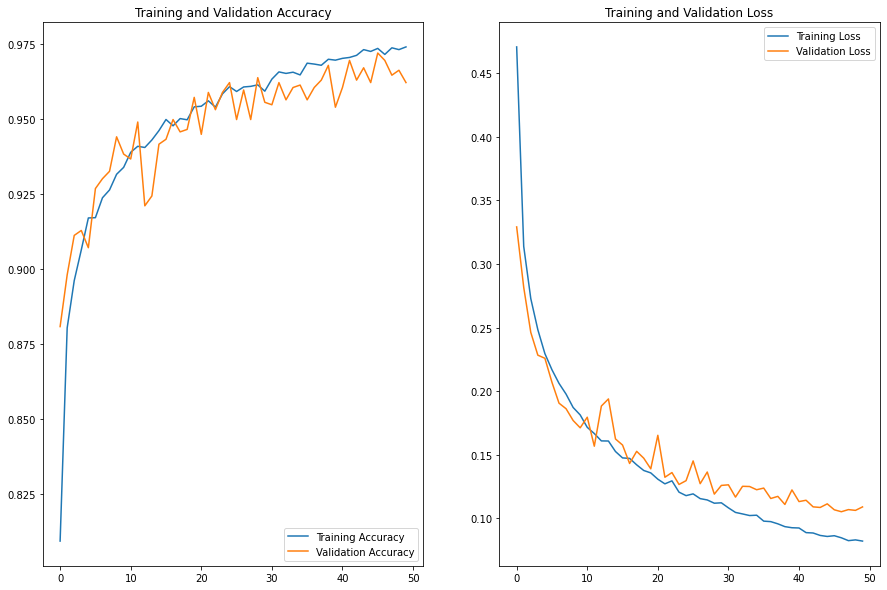

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc_2, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_2, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss_2, label='Training Loss')
plt.plot(range(EPOCHS), val_loss_2, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: TCGA-LUAD
predicted label: TCGA-LUAD


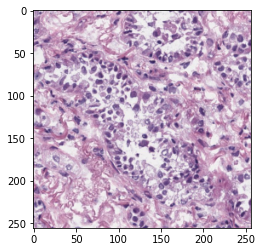

In [ ]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_2.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

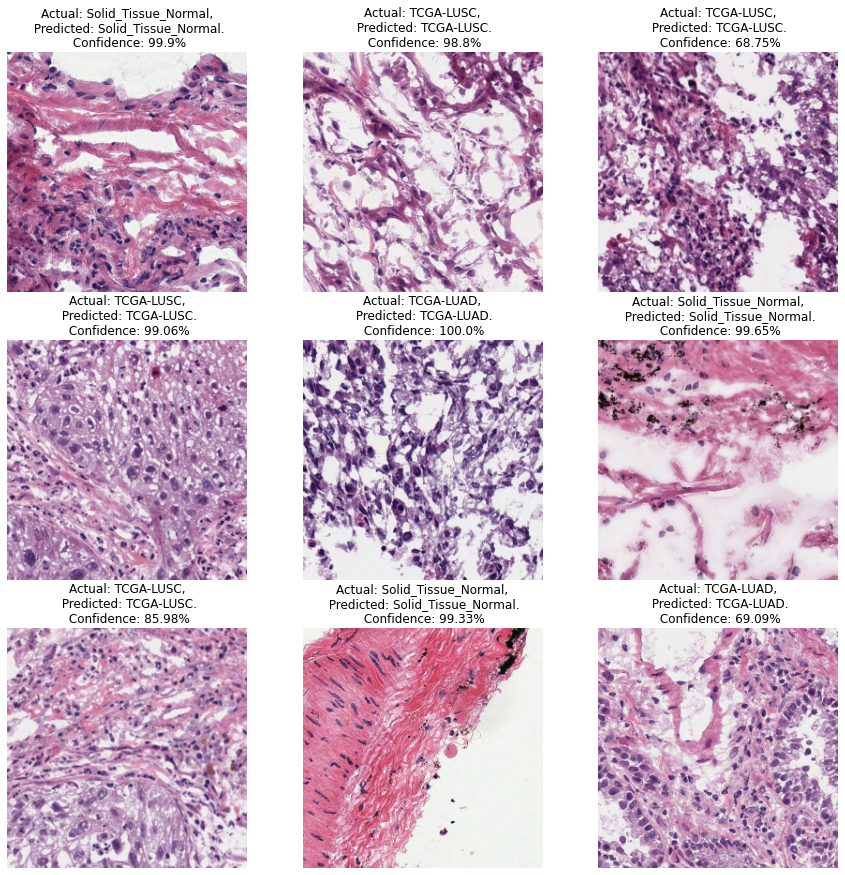

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_2, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [ ]:
#model_2.save('ResNet50_Best_new.h5')

# DenseNet121

In [ ]:
densenet = DenseNet121(
    input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3), # Making the image into 3 Channel, so concating 3.
    weights = 'imagenet', # Default weights.
    pooling = 'avg',
    include_top = False 
)

29097984/29084464 [==============================] - 1s 0us/step


In [ ]:
for layer in densenet.layers:
    layer.trainable = False
    
# This will let us use the default weights used by the imagenet.

In [ ]:
# Set the flatten layer.
x_3 = Flatten() (densenet.output)

In [ ]:
prediction_3 = Dense(len(class_names), activation = 'softmax')(x_3)

In [ ]:
# Create a model Object
model_3 = Model(inputs = densenet.input, outputs = prediction_3)

In [ ]:
model_3.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 262, 262, 3)  0          ['input_3[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 128, 128, 64  9408        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                            

In [ ]:
model_3.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
history_3 = model_3.fit(
    train_ds, 
    batch_size = BATCH_SIZE , 
    epochs = EPOCHS , 
    validation_data = val_ds,
    )

Epoch 1/50
311/311 [==============================] - 31s 82ms/step - loss: 0.7015 - accuracy: 0.7223 - val_loss: 0.4580 - val_accuracy: 0.8125
Epoch 2/50
311/311 [==============================] - 24s 77ms/step - loss: 0.4410 - accuracy: 0.8150 - val_loss: 0.4163 - val_accuracy: 0.8199
Epoch 3/50
311/311 [==============================] - 24s 77ms/step - loss: 0.3786 - accuracy: 0.8435 - val_loss: 0.4159 - val_accuracy: 0.8314
Epoch 4/50
311/311 [==============================] - 24s 77ms/step - loss: 0.3666 - accuracy: 0.8541 - val_loss: 0.3459 - val_accuracy: 0.8635
Epoch 5/50
311/311 [==============================] - 24s 78ms/step - loss: 0.3355 - accuracy: 0.8638 - val_loss: 0.3855 - val_accuracy: 0.8388
Epoch 6/50
311/311 [==============================] - 24s 77ms/step - loss: 0.3207 - accuracy: 0.8684 - val_loss: 0.3017 - val_accuracy: 0.8808
Epoch 7/50
311/311 [==============================] - 24s 77ms/step - loss: 0.3161 - accuracy: 0.8749 - val_loss: 0.2823 - val_accuracy:

In [ ]:
scores_3 = model_3.evaluate(test_ds)

40/40 [==============================] - 3s 68ms/step - loss: 0.2153 - accuracy: 0.9141


In [ ]:
res_df_3 = pd.DataFrame(history_3.history)
res_df_3

,loss,accuracy,val_loss,val_accuracy
0,0.701493,0.722267,0.457960,0.812500
1,0.440969,0.815012,0.416277,0.819901
2,0.378603,0.843549,0.415877,0.831414
3,0.366641,0.854100,0.345912,0.863487
4,0.335547,0.863846,0.385469,0.838816
5,0.320728,0.868368,0.301661,0.880757
6,0.316120,0.874900,0.282264,0.891447
7,0.309604,0.875804,0.271249,0.891447
8,0.299316,0.877311,0.292129,0.875822
9,0.292681,0.883340,0.262793,0.891447


In [ ]:
acc_3 = history_3.history['accuracy']
val_acc_3 = history_3.history['val_accuracy']

loss_3 = history_3.history['loss']
val_loss_3 = history_3.history['val_loss']

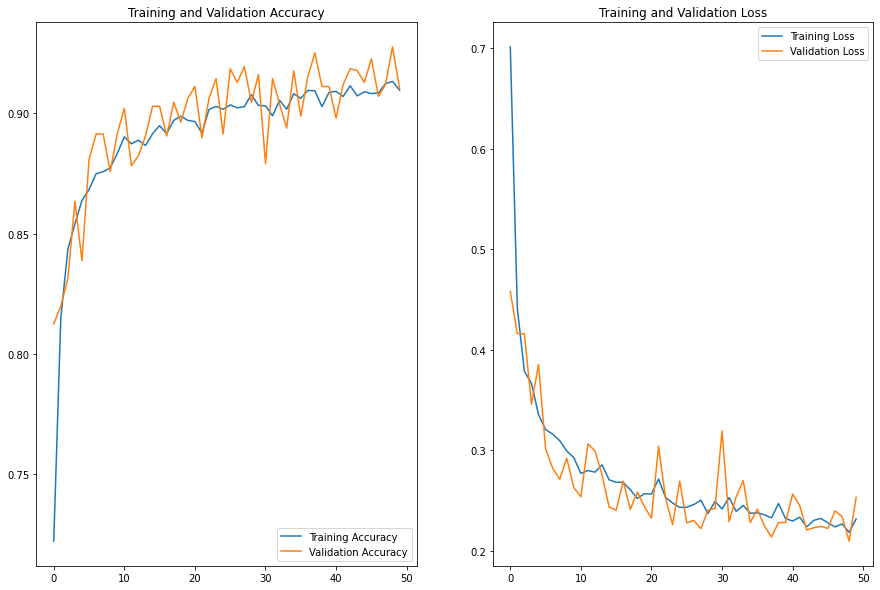

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc_3, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_3, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss_3, label='Training Loss')
plt.plot(range(EPOCHS), val_loss_3, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: TCGA-LUSC
predicted label: TCGA-LUSC


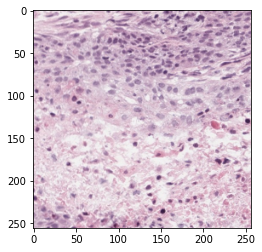

In [ ]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_3.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

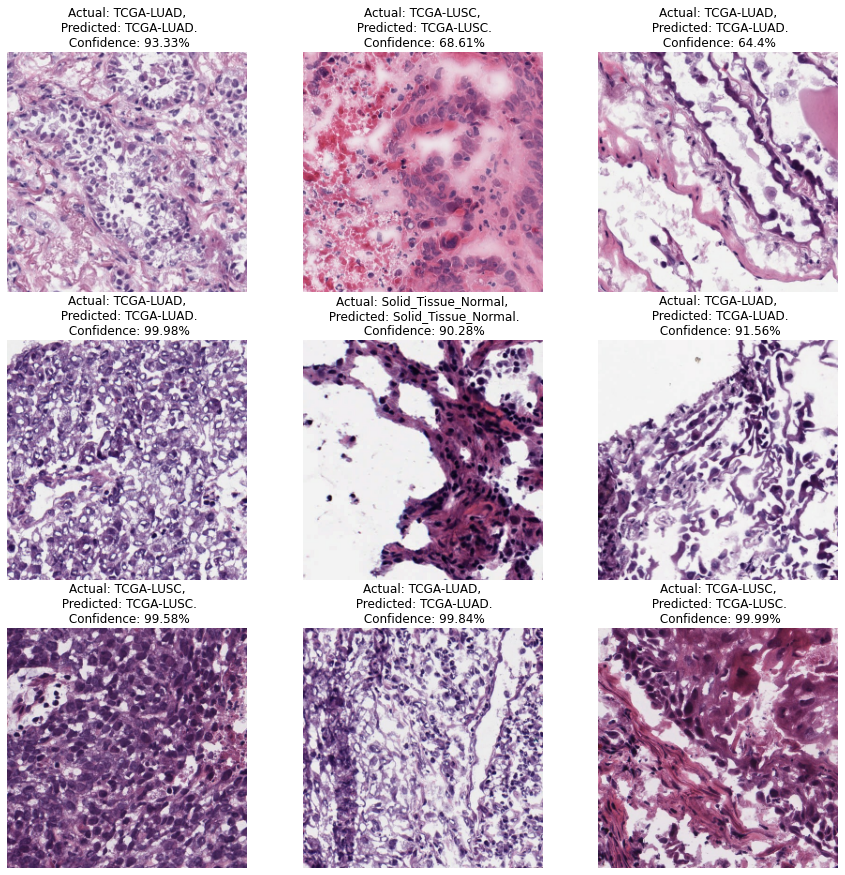

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_3, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [ ]:
#model_3.save('DenseNet121.h5')

# VGG16

In [ ]:
vgg_1 = VGG16(include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), pooling='avg', weights='imagenet')

58900480/58889256 [==============================] - 2s 0us/step


In [ ]:
for layer in vgg_1.layers:
    layer.trainable = False
    
# This will let us use the default weights used by the imagenet.

In [ ]:
# Set the flatten layer.
x_4 = Flatten() (vgg_1.output)

In [ ]:
prediction_4 = Dense(len(class_names), activation = 'softmax')(x_4)

In [ ]:
# Create a model Object
model_4 = Model(inputs = vgg_1.input, outputs = prediction_4)

In [ ]:
model_4.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0   

In [ ]:
model_4.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
history_4 = model_4.fit(
    train_ds, 
    batch_size = BATCH_SIZE , 
    epochs = EPOCHS , 
    validation_data = val_ds,
    )

Epoch 1/50
311/311 [==============================] - 34s 107ms/step - loss: 0.9811 - accuracy: 0.6672 - val_loss: 0.5544 - val_accuracy: 0.7887
Epoch 2/50
311/311 [==============================] - 33s 107ms/step - loss: 0.5011 - accuracy: 0.8059 - val_loss: 0.4192 - val_accuracy: 0.8429
Epoch 3/50
311/311 [==============================] - 33s 106ms/step - loss: 0.4159 - accuracy: 0.8419 - val_loss: 0.3633 - val_accuracy: 0.8553
Epoch 4/50
311/311 [==============================] - 33s 106ms/step - loss: 0.3786 - accuracy: 0.8547 - val_loss: 0.3626 - val_accuracy: 0.8544
Epoch 5/50
311/311 [==============================] - 33s 106ms/step - loss: 0.3625 - accuracy: 0.8569 - val_loss: 0.3436 - val_accuracy: 0.8627
Epoch 6/50
311/311 [==============================] - 33s 107ms/step - loss: 0.3424 - accuracy: 0.8654 - val_loss: 0.3279 - val_accuracy: 0.8635
Epoch 7/50
311/311 [==============================] - 33s 106ms/step - loss: 0.3289 - accuracy: 0.8725 - val_loss: 0.2956 - val_ac

In [ ]:
scores_4 = model_4.evaluate(test_ds)

40/40 [==============================] - 4s 95ms/step - loss: 0.2711 - accuracy: 0.8945


In [ ]:
res_df_4 = pd.DataFrame(history_4.history)
res_df_4

,loss,accuracy,val_loss,val_accuracy
0,0.981080,0.667203,0.554444,0.788651
1,0.501061,0.805868,0.419194,0.842928
2,0.415853,0.841941,0.363272,0.855263
3,0.378587,0.854703,0.362552,0.854441
4,0.362520,0.856913,0.343612,0.862664
5,0.342431,0.865354,0.327915,0.863487
6,0.328886,0.872488,0.295562,0.889803
7,0.321608,0.874498,0.302495,0.880757
8,0.317089,0.875502,0.300474,0.884046
9,0.311691,0.876708,0.292399,0.885691


In [ ]:
acc_4 = history_4.history['accuracy']
val_acc_4 = history_4.history['val_accuracy']

loss_4 = history_4.history['loss']
val_loss_4 = history_4.history['val_loss']

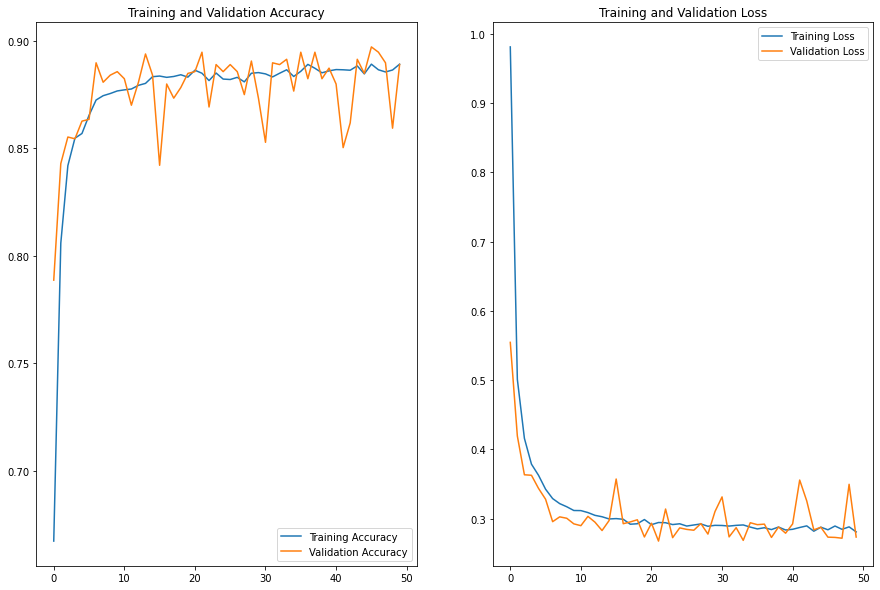

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc_4, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_4, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss_4, label='Training Loss')
plt.plot(range(EPOCHS), val_loss_4, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: TCGA-LUSC
predicted label: TCGA-LUSC


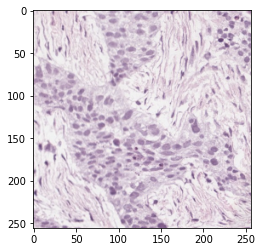

In [ ]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_4.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

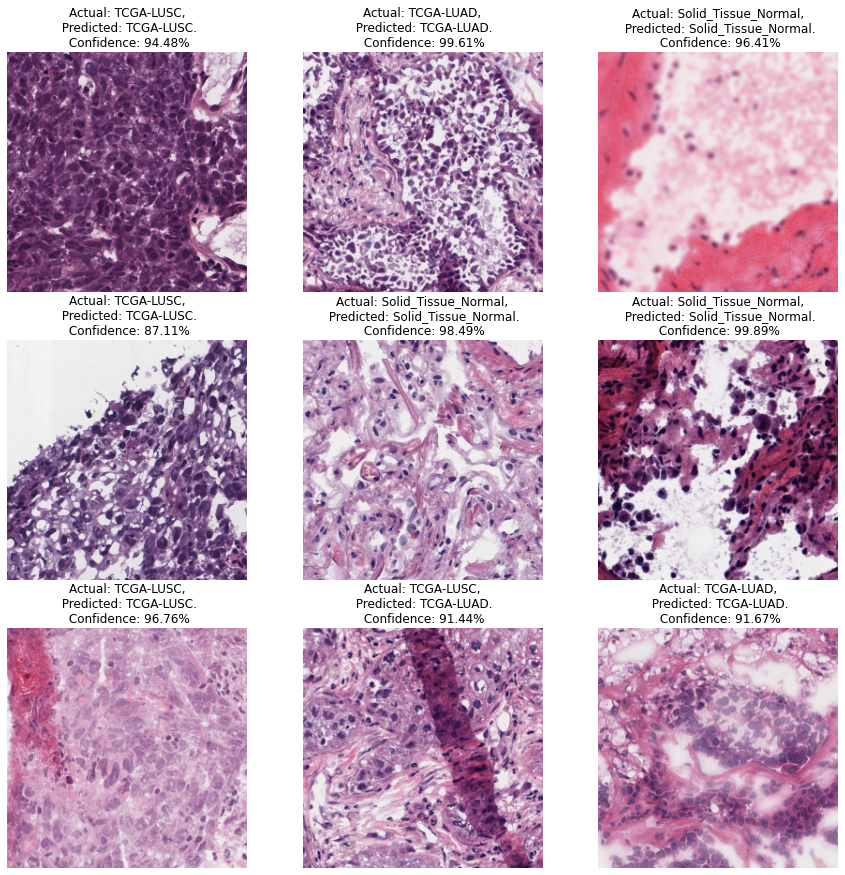

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_4, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [ ]:
#model_4.save('VGG16.h5')

# InceptionV3

In [ ]:
inception = InceptionV3(
    input_shape = (IMAGE_SIZE, IMAGE_SIZE, 3), # Making the image into 3 Channel, so concating 3.
    weights = 'imagenet', # Default weights.
    pooling = 'avg',
    include_top = False 
)

87924736/87910968 [==============================] - 4s 0us/step


In [ ]:
for layer in inception.layers:
    layer.trainable = False
    
# This will let us use the default weights used by the imagenet.

In [ ]:
# Set the flatten layer.
x_5 = Flatten() (inception.output)

In [ ]:
prediction_5 = Dense(len(class_names), activation = 'softmax')(x_5)

In [ ]:
# Create a model Object
model_5 = Model(inputs = inception.input, outputs = prediction_5)

In [ ]:
model_5.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 127, 127, 32  864         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 127, 127, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                           

In [ ]:
model_5.compile(optimizer='adam',
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
history_5 = model_5.fit(
    train_ds, 
    batch_size = BATCH_SIZE , 
    epochs = EPOCHS , 
    validation_data = val_ds,
    )

Epoch 1/50
311/311 [==============================] - 25s 67ms/step - loss: 3.7442 - accuracy: 0.5258 - val_loss: 2.5913 - val_accuracy: 0.5855
Epoch 2/50
311/311 [==============================] - 20s 64ms/step - loss: 2.2436 - accuracy: 0.5831 - val_loss: 1.5966 - val_accuracy: 0.6110
Epoch 3/50
311/311 [==============================] - 20s 64ms/step - loss: 1.9562 - accuracy: 0.6025 - val_loss: 1.7043 - val_accuracy: 0.6201
Epoch 4/50
311/311 [==============================] - 20s 64ms/step - loss: 1.8627 - accuracy: 0.6068 - val_loss: 2.7843 - val_accuracy: 0.5197
Epoch 5/50
311/311 [==============================] - 20s 64ms/step - loss: 1.8063 - accuracy: 0.6183 - val_loss: 1.3851 - val_accuracy: 0.6760
Epoch 6/50
311/311 [==============================] - 20s 64ms/step - loss: 1.6125 - accuracy: 0.6372 - val_loss: 1.0983 - val_accuracy: 0.6933
Epoch 7/50
311/311 [==============================] - 20s 64ms/step - loss: 1.6230 - accuracy: 0.6367 - val_loss: 2.3138 - val_accuracy:

In [ ]:
scores_5 = model_5.evaluate(test_ds)

40/40 [==============================] - 2s 57ms/step - loss: 1.0863 - accuracy: 0.6945


In [ ]:
res_df_5 = pd.DataFrame(history_5.history)
res_df_5

,loss,accuracy,val_loss,val_accuracy
0,3.744212,0.525824,2.591299,0.585526
1,2.243632,0.583099,1.596617,0.611020
2,1.956163,0.602492,1.704330,0.620066
3,1.862680,0.606813,2.784337,0.519737
4,1.806344,0.618268,1.385119,0.675987
5,1.612548,0.637158,1.098332,0.693257
6,1.623014,0.636656,2.313833,0.579770
7,1.567201,0.640876,1.424204,0.652961
8,1.444403,0.650623,1.625128,0.652961
9,1.539542,0.646604,1.592781,0.638980


In [ ]:
acc_5 = history_5.history['accuracy']
val_acc_5 = history_5.history['val_accuracy']

loss_5 = history_5.history['loss']
val_loss_5 = history_5.history['val_loss']

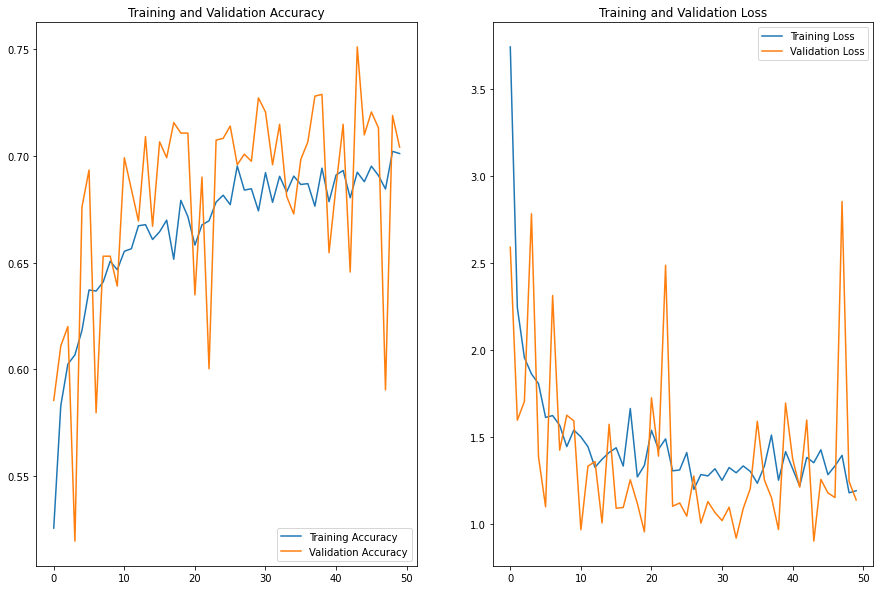

In [ ]:
plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc_5, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_5, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss_5, label='Training Loss')
plt.plot(range(EPOCHS), val_loss_5, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

first image to predict
actual label: TCGA-LUSC
predicted label: TCGA-LUSC


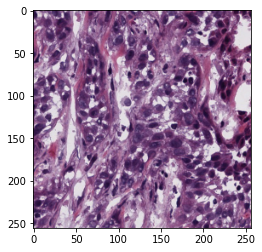

In [ ]:
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model_5.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

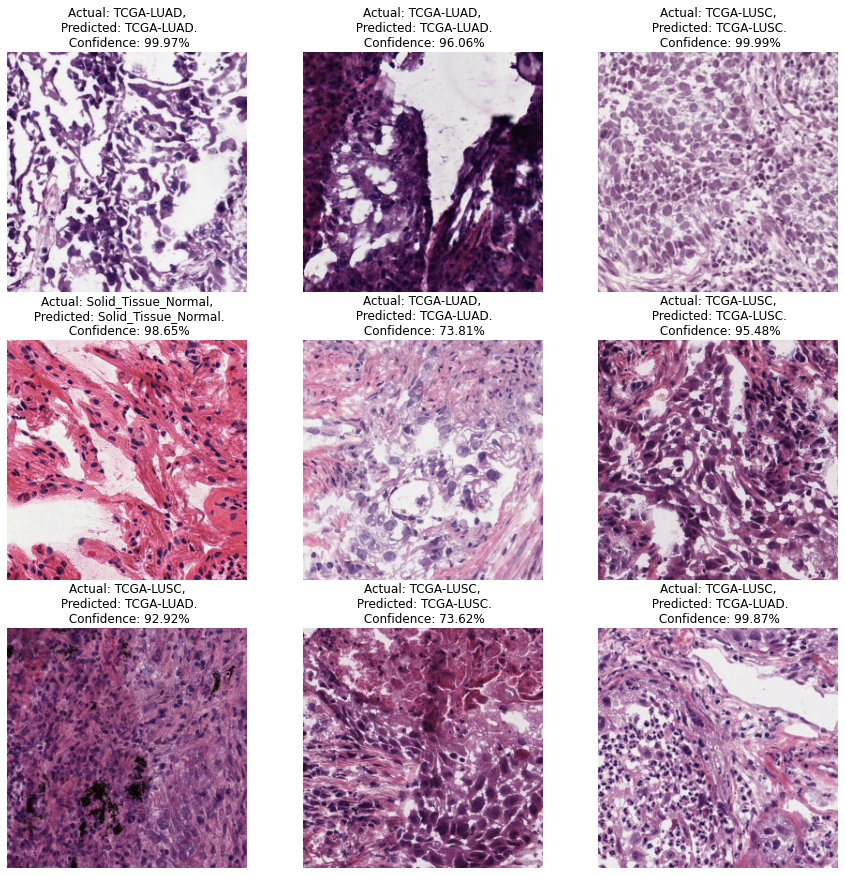

In [ ]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model_5, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

In [ ]:
#model_5.save('InceptionV3.h5')